In [82]:
import pickle
from rdkit import Chem
from rdkit.Chem import MACCSkeys
from rdkit.Chem import AllChem
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from collections import defaultdict

# Unconstrained generation

## PCA

### GLDM

In [6]:
models = ['aae', 'vae', 'wae']
path = 'generation_res/uncond/guacamol_latest_ldm_'

In [9]:
uncond_smi = {}
for m in models:
    with open(path+m+'_10000_smiles.pkl', 'rb') as f:
        uncond_smi[m] = pickle.load(f)
        
uncond_smi

{'aae': ['CCCC',
  'CCCO',
  'C',
  'CCN',
  'CCCN',
  'CCCN',
  'CC=O',
  'CCOC',
  'CC(C)C(F)(F)F',
  'NC1=NOC=N1',
  'OCCCC1CCCCC1',
  'CC12CC3CC(CC(C3)C1)C2',
  'O=[N+]([O-])C1=NC=CS1',
  'NC1C2CC3CC(C2)CC1C3',
  'NCCC1CCC1',
  'CC=O.ClC1=CC2=NC=CC=C2C=C1',
  'NCC1=CC=CC=C1',
  'NCC1=CC=CC=C1',
  'CCNC1=CC=C(N)C=C1',
  'CC1=CC=C2OC(Cl)=NC2=C1',
  'CC1=CC=CC(=O)N1',
  'CC(=O)NC1=CC=CC(O)=C1',
  'CC(C)CC1=CC=C(Br)C=C1',
  'O=C1CCCC2=CC=CC(Cl)=C12',
  'CCOC1=CC=CN=C1C',
  'CC1=CC2=CC(Cl)=CC=C2N1',
  'O=C1C=CC2=CC=C(Cl)C=C2O1',
  'OC1=CC=C(C2=CC=CC=C2)C=C1',
  'OC1=CC=C(O)C=C1',
  'CCOC1=CC=C2NC=C(Br)C2=C1',
  'NCCC1=CSC(I)=N1',
  'CC(=O)NC1=CN=C(Cl)N=C1',
  'CCNC1=CC=C(F)C=C1',
  'SC1=CN=CC(C2=CC=CC=C2)=C1',
  'CCC1=CN=CN1',
  'C1=COC(C2=CC=C(C3=CSC=N3)C=N2)=C1',
  'C1=CC=C(CCCNC2CCNC2)N=C1',
  'C1=CN=CC(OC2CCNC2)=C1',
  'BrC1=CC=C2N=C(C3=CC=CN=C3)C=CC2=C1',
  'CCNC1=CC=C(C(F)(F)F)C=C1',
  'O=[N+]([O-])C1=CC(OC(F)(F)F)=CC=C1',
  'C=CCC1=CC(C2=CN=CC=N2)=CC=N1',
  'COC(=O)NC(=O)CC1=CC=C

In [12]:
uncond_mols = {m:[Chem.MolFromSmiles(smi) for smi in uncond_smi[m]] for m in uncond_smi.keys()}
# uncond_mols

In [22]:
def compute_fp(mol_dict):
    fp_dict = {}
    for k, mols in mol_dict.items():
        for mol in mols:
            try:
                mol = Chem.SanitizeMol(mol)
            except Exception as e:
                print(e)
                
        morgan_fps = [
            list(AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=1024))
            for mol in mols
        ]
        maccs_fps = [list(MACCSkeys.GenMACCSKeys(mol)) for mol in mols]
        
        fp_dict[k] = {'morgan':morgan_fps, 'maccs':maccs_fps}
        
    return fp_dict

In [27]:
uncond_fp = compute_fp(uncond_mols)
# uncond_fp

In [28]:
uncond_fp['aae']['maccs'][0]

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0]

In [38]:
def pca_fp(fp):
#     for m in fp_dict.keys():
#         for fp_type, fp in fp_dict[m].items():
    fp_standardized = StandardScaler().fit_transform(fp)
    pca = PCA(n_components=0.9)
    X_pca = pca.fit_transform(fp_standardized)

#     for n_clusters in range(2, 9):
#         kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X_pca)
#         labels = kmeans.labels_
    
#         silhouette_avg = silhouette_score(X_pca, labels)
#         print(f"Silhouette Score: {silhouette_avg}")
    
    return X_pca #, kmeans, silhouette_avg

In [39]:
X_pca = pca_fp(uncond_fp['vae']['maccs'])

830000

In [43]:
X_pca.shape

(10000, 83)

In [46]:
dist_matrix = squareform(pdist(X_pca, 'euclidean'))
dist_matrix

array([[ 0.        , 15.13312073, 10.4478693 , ..., 19.63927821,
        19.01102811, 20.34342039],
       [15.13312073,  0.        , 13.4788198 , ..., 20.59939227,
        19.16579034, 19.01857599],
       [10.4478693 , 13.4788198 ,  0.        , ..., 18.09799837,
        17.27738878, 18.7437912 ],
       ...,
       [19.63927821, 20.59939227, 18.09799837, ...,  0.        ,
        14.66964463, 14.69351116],
       [19.01102811, 19.16579034, 17.27738878, ..., 14.66964463,
         0.        , 15.38806814],
       [20.34342039, 19.01857599, 18.7437912 , ..., 14.69351116,
        15.38806814,  0.        ]])

In [47]:
dist_matrix.shape

(10000, 10000)

In [48]:
avg_dist = np.mean(dist_matrix)
avg_dist

16.37707717014774

In [51]:
pca_dict = {}
dist_dict = {}
for m in uncond_fp.keys():
    pca_dict[m] = {}
    dist_dict[m] = {}
    for k, fp in uncond_fp[m].items():
        X_pca = pca_fp(fp)
        dist_matrix = squareform(pdist(X_pca, 'euclidean'))
        avg_dist = np.mean(dist_matrix)
        pca_dict[m][k] = X_pca
        dist_dict[m][k] = dist_matrix
        print(f"model {m} fingerprint {k} has avg dist of {avg_dist}")

model aae fingerprint morgan has avg dist of 42.676039269753105
model aae fingerprint maccs has avg dist of 16.33645397445218
model vae fingerprint morgan has avg dist of 42.6148759547567
model vae fingerprint maccs has avg dist of 16.37707717014774
model wae fingerprint morgan has avg dist of 42.6726058823499
model wae fingerprint maccs has avg dist of 16.27033538201983


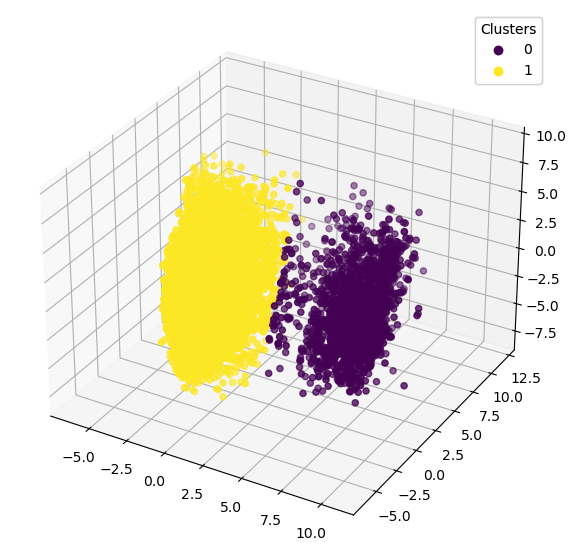

In [35]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(x_pca[:, 0], x_pca[:, 1], x_pca[:, 2], c=kmeans.labels_, cmap='viridis')

# Adding legend for clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

plt.show()

### Original Guacamol dataset

In [110]:
guacamol_smi = pd.read_csv('/data/ongh0068/guacamol/guacamol_v1_all.smiles', header=None).values.reshape(-1)
guacamol_smi.shape

(1591378,)

In [111]:
guacamol_smi = np.random.choice(guacamol_smi, 10000, replace=False).tolist()
len(set(guacamol_smi))

10000

In [112]:
guaca_mols = [Chem.MolFromSmiles(smi) for smi in guacamol_smi]

In [113]:
for mol in guaca_mols:
    try:
        mol = Chem.SanitizeMol(mol)
    except Exception as e:
        print(e)

guaca_morgan_fps = [
    list(AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=1024))
    for mol in guaca_mols
]
guaca_maccs_fps = [list(MACCSkeys.GenMACCSKeys(mol)) for mol in guaca_mols]

guaca_fp = {'morgan':guaca_morgan_fps, 'maccs':guaca_maccs_fps}

In [114]:
guaca_pca = {}
guaca_dist = {}
for k, fp in guaca_fp.items():
    X_pca = pca_fp(fp)
    dist_matrix = squareform(pdist(X_pca, 'euclidean'))
    avg_dist = np.mean(dist_matrix)
    guaca_pca[k] = X_pca
    guaca_dist[k] = dist_matrix
    print(f"guacamol fingerprint {k} has avg dist of {avg_dist}")

guacamol fingerprint morgan has avg dist of 42.69209224785554
guacamol fingerprint maccs has avg dist of 16.229281758585113


In [115]:
pca_dict['guacamol'] = guaca_pca
dist_dict['guacamol'] = guaca_dist

### Baseline models
digress, gdss, moler, jt-vae

In [109]:
paths = {
    'digress': '/data/conghao001/FYP/drug_discovery/DiGress/generated_samples/digress_guacamol_smiles.txt',
    'gdss': '/data/conghao001/FYP/drug_discovery/GDSS/logs_sample/GUACAMOL10K/test/Aug15-07_01_29_433-sample.txt',
    'moler': '/data/conghao001/FYP/DrugDiscovery/generation_res/moler_samples.txt',
    'jtvae': '/data/conghao001/FYP/drug_discovery/FastJTNNpy3/data/samples.txt'
}

In [128]:
bs_uncond_smi = {}
for model, path in paths.items():
    df = pd.read_csv(path, header=None)
    smis = df.values.reshape(-1)
    smis = smis[smis != 'None']
    smis = np.random.choice(smis, 10000, replace=False)
    print(len(smis))
    bs_uncond_smi[model] = smis

10000
10000
10000
10000


In [133]:
bs_uncond_mols = {m:[Chem.MolFromSmiles(smi) for smi in bs_uncond_smi[m]] for m in bs_uncond_smi.keys()}
bs_uncond_fp = compute_fp(bs_uncond_mols)

In [134]:
for m in bs_uncond_fp.keys():
    pca_dict[m] = {}
    dist_dict[m] = {}
    for k, fp in bs_uncond_fp[m].items():
        X_pca = pca_fp(fp)
        dist_matrix = squareform(pdist(X_pca, 'euclidean'))
        avg_dist = np.mean(dist_matrix)
        pca_dict[m][k] = X_pca
        dist_dict[m][k] = dist_matrix
        print(f"model {m} fingerprint {k} has avg dist of {avg_dist}")

model digress fingerprint morgan has avg dist of 42.724955975166196
model digress fingerprint maccs has avg dist of 16.17905655712331
model gdss fingerprint morgan has avg dist of 42.57916427103811
model gdss fingerprint maccs has avg dist of 15.399062298855915
model moler fingerprint morgan has avg dist of 42.1713500393865
model moler fingerprint maccs has avg dist of 16.149121190699013
model jtvae fingerprint morgan has avg dist of 42.2495962917854
model jtvae fingerprint maccs has avg dist of 15.339936041447364


In [135]:
pca_dict.keys(), dist_dict.keys()

(dict_keys(['aae', 'vae', 'wae', 'guacamol', 'digress', 'gdss', 'moler', 'jtvae']),
 dict_keys(['aae', 'vae', 'wae', 'guacamol', 'digress', 'gdss', 'moler', 'jtvae']))

In [136]:
with open('uncond_pca.pkl', 'wb') as f:
    pickle.dump(pca_dict, f)

with open('uncond_distance.pkl', 'wb') as f:
    pickle.dump(dist_dict, f)

## Murcko scaffolds

In [53]:
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles

In [54]:
murcko_dict = {}
for m, smis in uncond_smi.items():
    scaffolds = [MurckoScaffoldSmiles(smi) for smi in smis]
    murcko_dict[m] = scaffolds

In [55]:
murcko_dict

{'aae': ['',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  '',
  'c1ncon1',
  'C1CCCCC1',
  'C1C2CC3CC1CC(C2)C3',
  'c1cscn1',
  'C1C2CC3CC1CC(C2)C3',
  'C1CCC1',
  'c1ccc2ncccc2c1',
  'c1ccccc1',
  'c1ccccc1',
  'c1ccccc1',
  'c1ccc2ocnc2c1',
  'O=c1cccc[nH]1',
  'c1ccccc1',
  'c1ccccc1',
  'O=C1CCCc2ccccc21',
  'c1ccncc1',
  'c1ccc2[nH]ccc2c1',
  'O=c1ccc2ccccc2o1',
  'c1ccc(-c2ccccc2)cc1',
  'c1ccccc1',
  'c1ccc2[nH]ccc2c1',
  'c1cscn1',
  'c1cncnc1',
  'c1ccccc1',
  'c1ccc(-c2cccnc2)cc1',
  'c1c[nH]cn1',
  'c1coc(-c2ccc(-c3cscn3)cn2)c1',
  'c1ccc(CCCNC2CCNC2)nc1',
  'c1cncc(OC2CCNC2)c1',
  'c1cncc(-c2ccc3ccccc3n2)c1',
  'c1ccccc1',
  'c1ccccc1',
  'c1cc(-c2cnccn2)ccn1',
  'c1ccncc1',
  'c1ccc(-c2ccn3nccc3n2)cc1',
  'O=C(Cc1cscn1)Nc1ccccc1',
  '',
  'c1ccc(-c2ccon2)cc1',
  'C1CCCC1',
  'c1ccc2c(c1)CCC(C1CNCCN1)C2',
  'c1cncnc1',
  'c1ccc2nc(CN3CCCCC3)ncc2c1',
  'c1ccc(-c2ccccc2)cc1',
  'c1ccc(-c2c[nH]c3ccccc23)nc1',
  'c1cc(N2CCOCC2)ncn1',
  'C1CC(c2nn[nH]n2)CCN1.c1ccccc1',
  'c1ccc(-

In [129]:
for m, smis in bs_uncond_smi.items():
    scaffolds = [MurckoScaffoldSmiles(smi) for smi in smis]
    murcko_dict[m] = scaffolds

In [131]:
for k, v in murcko_dict.items():
    print(f'model {k} has unique Murcko scaffolds of ratio {len(set(v))/len(v)}')

model aae has unique Murcko scaffolds of ratio 0.8633
model vae has unique Murcko scaffolds of ratio 0.8647
model wae has unique Murcko scaffolds of ratio 0.8825
model digress has unique Murcko scaffolds of ratio 0.921
model gdss has unique Murcko scaffolds of ratio 0.792
model moler has unique Murcko scaffolds of ratio 0.4027
model jtvae has unique Murcko scaffolds of ratio 0.2475


In [100]:
guaca_scaffolds = [MurckoScaffoldSmiles(smi) for smi in guacamol_smi]
print(len(set(guaca_scaffolds))/len(guaca_scaffolds))

0.8487


# Constrained generation

## PCA

### GLDM

In [58]:
cond_path = 'generation_res/cond/ldm_con_'

In [60]:
cond_smi = {}
for m in models:
    with open(cond_path+m+'_generated_molecules_and_sa_scores.pkl', 'rb') as f:
        cond_smi[m] = pickle.load(f)
        
cond_smi

{'aae': {'COc1ccccc1N1CCN(CC(O)COc2cccc3ccccc23)CC1_159': {'generated_mols': [<rdkit.Chem.rdchem.RWMol at 0x7f66ac5eaf40>,
   'generated_smiles': ['O=C(NC1=CC=C(C2CCCCO2)C=C1)C(C1=CC=C(C2=CC=C3OCOC3=C2)C=C1)C1=CC=C2OCOC2=C1',
    'O=S(=O)(Cl)NC1CCC(NS(=O)(=O)C2=C(Cl)ON=C2Cl)OC1',
    'O=C(C1=CC=C(C2=CC=C(C3=CC=C(C4=CC=CO4)C=C3)C=C2)C=C1)N1CCCCC1',
    'O=[N+]([O-])C1=CC=C(C2([N+](=O)[O-])CCN(C3=C(N4CCOCC4)C=CC(C4=CC=C([N+](=O)[O-])C(C(F)(F)F)=C4)=N3)CC2)O1',
    'O=C(CC1=NN=C(S)O1)N1CCNCC1N1CCN(SS(=O)(=O)O)CC1',
    'CC(CO)NC(=O)CC1CCNCC1(NC(=O)C(F)C(C1=CC=CC=C1)C1=CC=CC=C1)C1=CC(F)=CC=C1F',
    'CCOC1=CC=C(C2=CC=C(N3CCN(C4=CC=C(S(=O)(=O)N5CCOCC5)C=C4)CC3)C(OCCN3CCOCC3)=C2)C=C1Cl',
    'O=C(ON1CCCCC1)C1=NC(OO)=CC=C1C1=CC(O)=C(O)C(O)=C1O',
    'CCOC1=CC=C(SC2=NC(C3=CC=C(N4CCOCC4)C=C3)=NC3=CC=C(C4=C(C5=NN=C(C6=CC=CC7=C([N+](=O)[O-])C=CC=C67)O5)C5=CC=CC=C5S4)C=C32)C(Br)=C1',
    'O=C(NC1=CC=C2OCCOC2=C1)C1CN(C(=O)NC2=CC=C(C(F)(F)F)C=C2)CCN1C(=O)C(C1=CC=CC=C1)C1=CC=C(C2=CC=CC(C(F)(F)F)=C2)C

In [62]:
len(cond_smi['aae']['COc1ccccc1N1CCN(CC(O)COc2cccc3ccccc23)CC1_159']['generated_smiles'])

100

In [63]:
len(cond_smi['aae'])

356

In [68]:
def collect_smi(smi_dict):
    out = defaultdict(lambda :[])
    for m, v in smi_dict.items():
        for ref_smi, sub_v in v.items():
            smis = sub_v['generated_smiles']
#             out[m].append(smis)
            out[m] += smis
    
    return out

In [69]:
all_cond_smi = collect_smi(cond_smi)
len(all_cond_smi['aae'])

35600

In [71]:
cond_mols = {m:[Chem.MolFromSmiles(smi) for smi in all_cond_smi[m]] for m in all_cond_smi.keys()}
cond_fp = compute_fp(cond_mols)

In [72]:
cond_pca_dict = {}
cond_dist_dict = {}
for m in cond_fp.keys():
    cond_pca_dict[m] = {}
    cond_dist_dict[m] = {}
    for k, fp in cond_fp[m].items():
        X_pca = pca_fp(fp)
        dist_matrix = squareform(pdist(X_pca, 'euclidean'))
        avg_dist = np.mean(dist_matrix)
        cond_pca_dict[m][k] = X_pca
        cond_dist_dict[m][k] = dist_matrix
        print(f"model {m} fingerprint {k} has avg dist of {avg_dist}")

model aae fingerprint morgan has avg dist of 42.65950831773837
model aae fingerprint maccs has avg dist of 16.222455850700623
model vae fingerprint morgan has avg dist of 42.26594217554744
model vae fingerprint maccs has avg dist of 15.526757718472266
model wae fingerprint morgan has avg dist of 42.48003750901255
model wae fingerprint maccs has avg dist of 15.455226979381159


In [79]:
cond_pca_dict['aae']['morgan'].shape, cond_dist_dict['aae']['morgan'].shape

((35600, 813), (35600, 35600))

### Original L1000 dataset

In [102]:
l1000_smi = pd.read_csv('/data/ongh0068/l1000/l1000_biaae/lincs/l1000.smiles', header=None).values.reshape(-1).tolist()
l1000_mols = [Chem.MolFromSmiles(smi) for smi in l1000_smi]
len(l1000_mols)

5216

In [103]:
for mol in l1000_mols:
    try:
        mol = Chem.SanitizeMol(mol)
    except Exception as e:
        print(e)

l1000_morgan_fps = [
    list(AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=1024))
    for mol in l1000_mols
]
l1000_maccs_fps = [list(MACCSkeys.GenMACCSKeys(mol)) for mol in l1000_mols]

l1000_fp = {'morgan':l1000_morgan_fps, 'maccs':l1000_maccs_fps}

In [104]:
l1000_pca = {}
l1000_dist = {}
for k, fp in l1000_fp.items():
    X_pca = pca_fp(fp)
    dist_matrix = squareform(pdist(X_pca, 'euclidean'))
    avg_dist = np.mean(dist_matrix)
    l1000_pca[k] = X_pca
    l1000_dist[k] = dist_matrix
    print(f"l1000 fingerprint {k} has avg dist of {avg_dist}")

l1000 fingerprint morgan has avg dist of 42.77436012335528
l1000 fingerprint maccs has avg dist of 15.574619099616864


In [105]:
cond_pca_dict['l1000'] = l1000_pca
cond_dist_dict['l1000'] = l1000_dist

### Baseline model
BiAAE

In [118]:
with open('/data/conghao001/FYP/drug_discovery/BiAAE/cond_generation_res/biaae_generated_molecules_and_sa_scores.pkl', 'rb') as f:
    biaae_data = pickle.load(f)

In [121]:
biaae_smi = []
for ref_smi, v in biaae_data.items():
    smis = v['generated_smiles']
#             out[m].append(smis)
    biaae_smi += smis
    
biaae_mols = [Chem.MolFromSmiles(smi) for smi in biaae_smi]
len(biaae_mols)

29329

In [122]:
for mol in biaae_mols:
    try:
        mol = Chem.SanitizeMol(mol)
    except Exception as e:
        print(e)

biaae_morgan_fps = [
    list(AllChem.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=1024))
    for mol in biaae_mols
]
biaae_maccs_fps = [list(MACCSkeys.GenMACCSKeys(mol)) for mol in biaae_mols]

biaae_fp = {'morgan':biaae_morgan_fps, 'maccs':biaae_maccs_fps}

In [123]:
biaae_pca = {}
biaae_dist = {}
for k, fp in biaae_fp.items():
    X_pca = pca_fp(fp)
    dist_matrix = squareform(pdist(X_pca, 'euclidean'))
    avg_dist = np.mean(dist_matrix)
    biaae_pca[k] = X_pca
    biaae_dist[k] = dist_matrix
    print(f"l1000 fingerprint {k} has avg dist of {avg_dist}")

l1000 fingerprint morgan has avg dist of 42.82172830996852
l1000 fingerprint maccs has avg dist of 15.510401610419885


In [124]:
cond_pca_dict['biaae'] = biaae_pca
cond_dist_dict['biaae'] = biaae_dist

In [125]:
with open('cond_pca.pkl', 'wb') as f:
    pickle.dump(cond_pca_dict, f)

with open('cond_distance.pkl', 'wb') as f:
    pickle.dump(cond_dist_dict, f)

## Murcko scaffolds

In [74]:
cond_murcko_dict = {}
for m, smis in all_cond_smi.items():
    scaffolds = [MurckoScaffoldSmiles(smi) for smi in smis]
    cond_murcko_dict[m] = scaffolds

In [108]:
for k, v in cond_murcko_dict.items():
    print(k, len(set(v))/len(v))

aae 0.9366011235955056
vae 0.14115168539325842
wae 0.39252808988764043


In [107]:
l1000_scaffolds = [MurckoScaffoldSmiles(smi) for smi in l1000_smi]
print(len(set(l1000_scaffolds))/len(l1000_scaffolds))

0.6380368098159509


In [126]:
biaae_scaffolds = [MurckoScaffoldSmiles(smi) for smi in biaae_smi]
print(len(set(biaae_scaffolds))/len(biaae_scaffolds))

0.8236898632752566
